# Employee Attrition Prediction

## Name- RANITA DAS
### City- New Delhi

### We are going to discuss employee attrition prediction i.e. predicting that employee will leave the current company (or will resign from the current company) for managing workforce,smooth pipeline and hiring management.

In [1]:
#importing libraries for analysis
import numpy as np
import pandas as pd

#importing libraries for visualisation
import matplotlib as cm
import matplotlib.pyplot as plt
import seaborn as sns

#To ignore the warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
#importing the dataset
data = pd.read_excel('MAS_project.xlsx')
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [3]:
data.shape

(1470, 35)

# Data Cleaning and Preparation

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [5]:
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

### We see that our data doen not contain any null values. Now we shall check for the statistical information of our dataset

In [6]:
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


### So much we have got to know about our int type of the dataset. We now proceed to check for the columns having dtype=object

In [7]:
object_cols = data.select_dtypes(include='object').columns
object_cols

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

In [8]:
for i in object_cols:
    unique_value = len(data[i].value_counts())
    if unique_value == 1:
        print(i)


Over18


### We see that columns like "EmployeeCount","StandardHours" and "Over18" have only one value entered in all the rows. Therefore, we may drop those columns since they would not create much of a difference

In [9]:
data.drop(['EmployeeCount','StandardHours','Over18'], axis=1, inplace = True)
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8


In [10]:
data.shape

(1470, 32)

## Part I- EXPLORATORY DATA ANALYSIS

In [11]:
data_copy = data.copy()

<AxesSubplot:xlabel='Attrition', ylabel='count'>

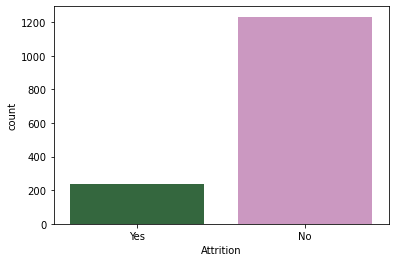

In [12]:
sns.countplot(x= data_copy['Attrition'], palette='cubehelix')

In [13]:
#Creating age groups at an interval of 10
data_copy.Age = pd.cut(data.Age,range(10,70,10))
data_copy.Age

0       (40, 50]
1       (40, 50]
2       (30, 40]
3       (30, 40]
4       (20, 30]
          ...   
1465    (30, 40]
1466    (30, 40]
1467    (20, 30]
1468    (40, 50]
1469    (30, 40]
Name: Age, Length: 1470, dtype: category
Categories (5, interval[int64, right]): [(10, 20] < (20, 30] < (30, 40] < (40, 50] < (50, 60]]

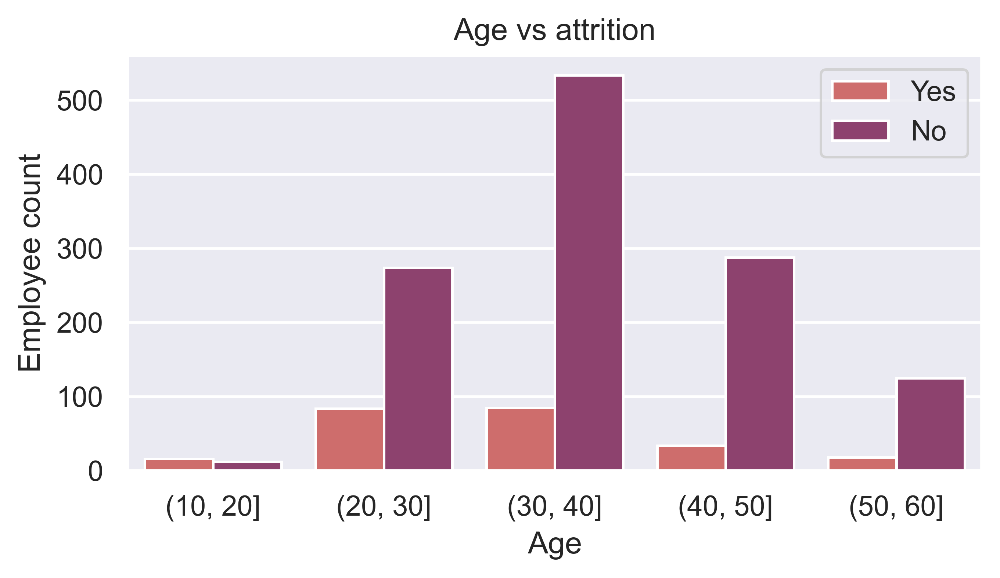

In [92]:
plt.figure(dpi=500, figsize=(6,3))
sns.countplot(x='Age', hue="Attrition", data=data_copy, palette='flare')
plt.xlabel('Age')
plt.ylabel('Employee count')
plt.title('Age vs attrition')
plt.legend()

# From the above graph on Age vs Attrition, we can infer the following:
1. Attrition is getting reduced with age
2. Majority of the people in the age group 20-30 years are leaving the company, maybe in search of better porition or job oppurtunities. And majority are staying back in the age group of 30-40 years.
3. More than 50% of attrition is seen in the age group of 10-20 years, but it is not a problem because very few employees are there in this age group and most of them would be interns only.
4. During the age group of 50-60 not many people are seen leaving the company as thats tha retirement time.


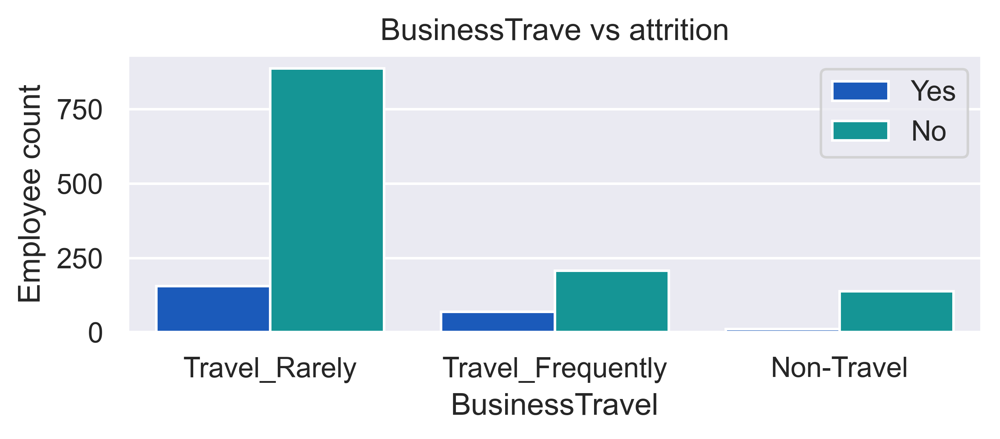

In [97]:
plt.figure(dpi=500, figsize=(6,2))
sns.countplot(x='BusinessTravel', hue="Attrition", data=data_copy, palette='winter')
plt.xlabel('BusinessTravel')
plt.ylabel('Employee count')
plt.title('BusinessTrave vs attrition')
plt.legend()

<AxesSubplot:xlabel='BusinessTravel,Attrition'>

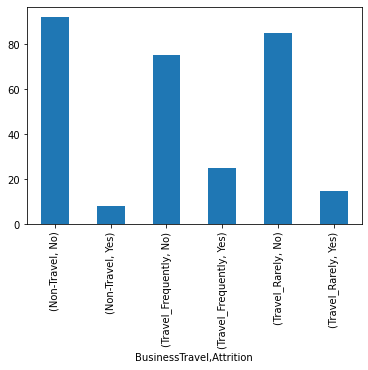

In [16]:
#Normalizing the data on a scale of 100
(data_copy.groupby(['BusinessTravel'])['Attrition'].value_counts(normalize=True)*100).plot(kind='bar')

### From the above graph on Business Travel vs Attrition, we can infer that a comapratively higher percentage of employees who travel frequently tend to have higher attrition compared to employees who travel rarely or not travel at all.


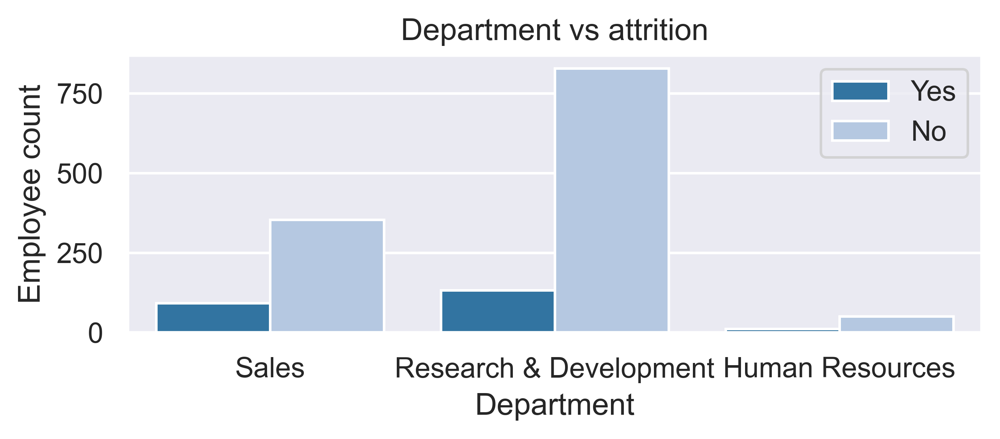

In [98]:
plt.figure(dpi=500, figsize=(6,2))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='Department', hue="Attrition", data=data_copy, palette='tab20')
plt.xlabel('Department')
plt.ylabel('Employee count')
plt.title('Department vs attrition')
plt.legend()

<AxesSubplot:xlabel='Department,Attrition'>

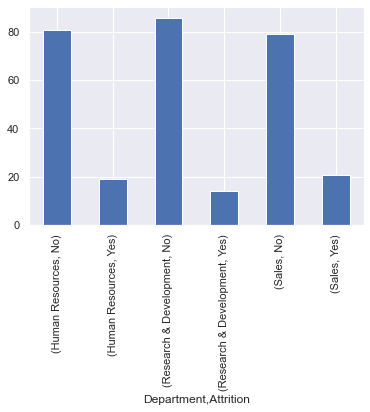

In [18]:
#Normalizing the data on a scale of 1
(data_copy.groupby(['Department'])['Attrition'].value_counts(normalize=True)*100).plot(kind='bar')


### From the above graph on Business Travel vs Attrition, we can infer that a higher percentage of attrition in employees of Human Resources and Sales department. 

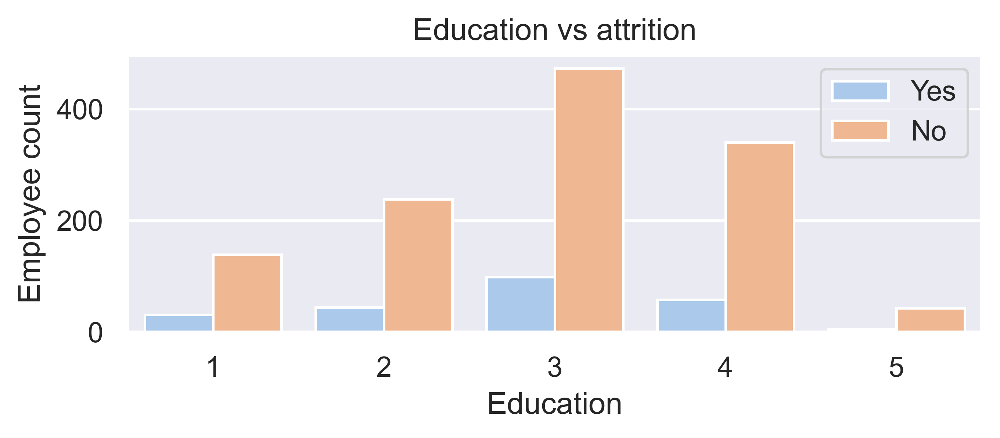

In [99]:
plt.figure(dpi=500, figsize=(6,2))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='Education', hue="Attrition", data=data_copy, palette='pastel')
plt.xlabel('Education')
plt.ylabel('Employee count')
plt.title('Education vs attrition')
plt.legend()

<AxesSubplot:xlabel='Education,Attrition'>

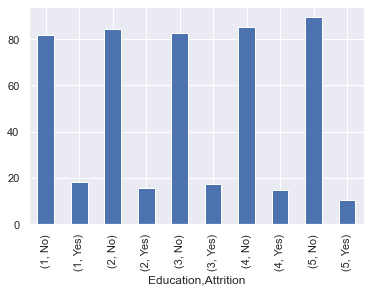

In [20]:
#Normalizing the data on a scale of 100
(data_copy.groupby(['Education'])['Attrition'].value_counts(normalize=True)*100).plot(kind='bar')

### Here we can say that education level is not having much of an impact on attrition

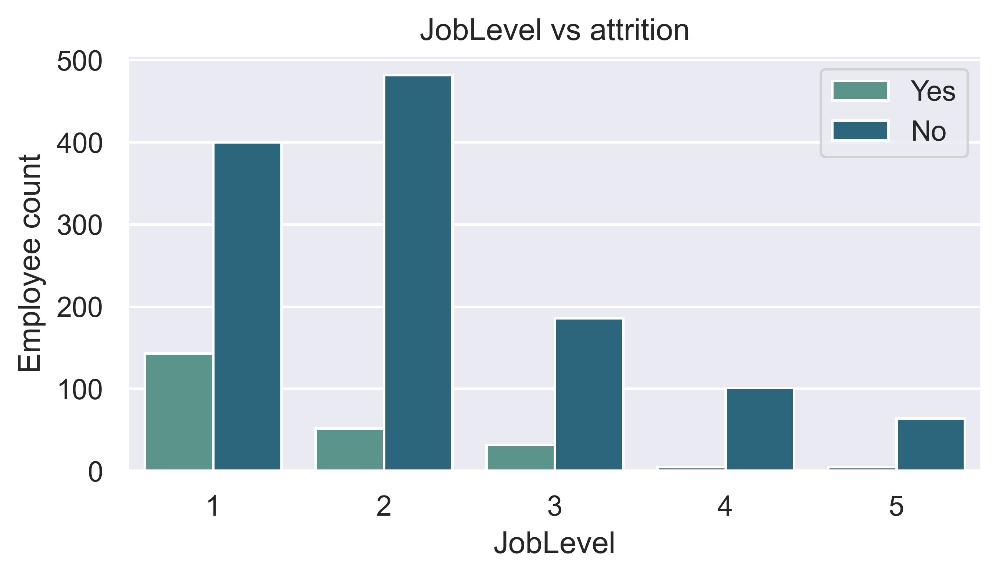

In [102]:
plt.figure(dpi=500, figsize=(6,3))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='JobLevel', hue="Attrition", data=data_copy, palette='crest')
plt.xlabel('JobLevel')
plt.ylabel('Employee count')
plt.title('JobLevel vs attrition')
plt.legend()

In [22]:
(data_copy.groupby(['JobLevel'])['Attrition'].value_counts(normalize=True)*100)

JobLevel  Attrition
1         No           73.664825
          Yes          26.335175
2         No           90.262172
          Yes           9.737828
3         No           85.321101
          Yes          14.678899
4         No           95.283019
          Yes           4.716981
5         No           92.753623
          Yes           7.246377
Name: Attrition, dtype: float64

### Employees with lower job level have a higher percentage of attrition

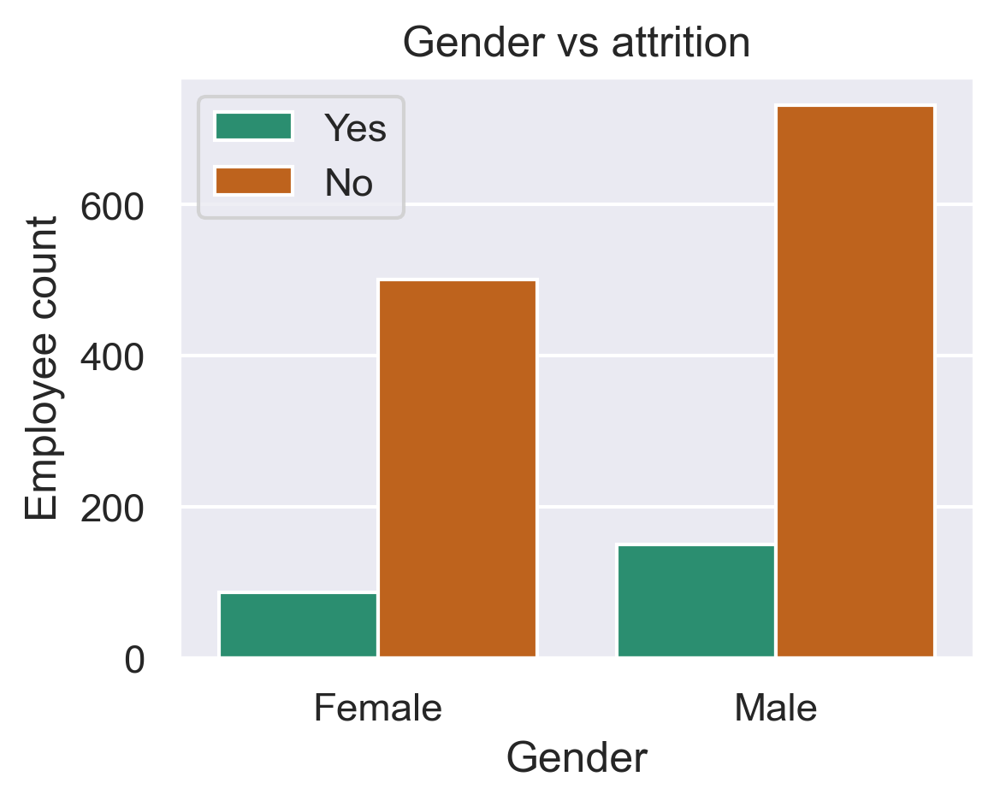

In [109]:
plt.figure(dpi=300, figsize=(4,3))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='Gender', hue="Attrition", data=data_copy, palette='Dark2')
plt.xlabel('Gender')
plt.ylabel('Employee count')
plt.title('Gender vs attrition')
plt.legend()

#### We see that gender does not seem to have much of an impact on attrition

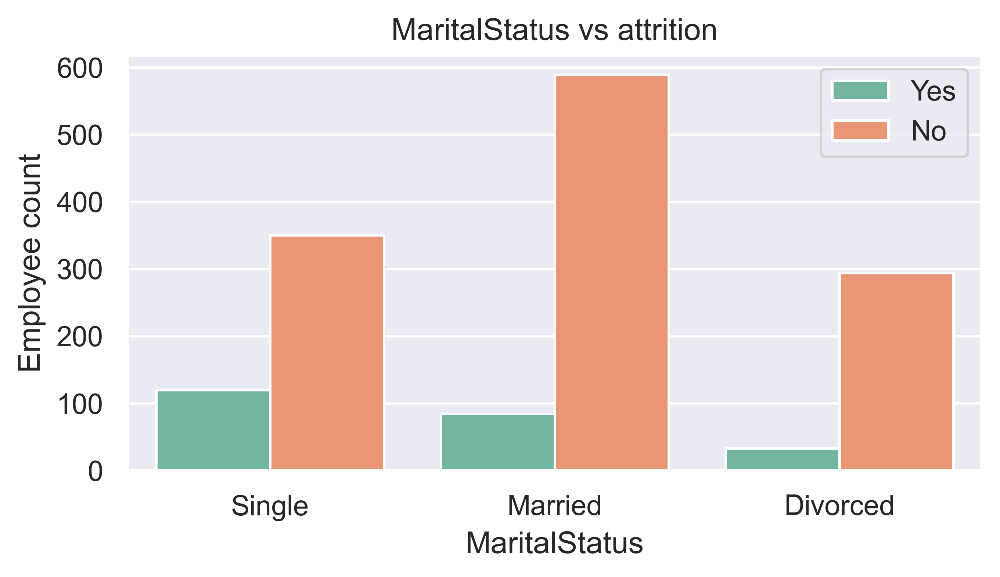

In [111]:
plt.figure(dpi=500, figsize=(6,3))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='MaritalStatus', hue="Attrition", data=data_copy, palette='Set2')
plt.xlabel('MaritalStatus')
plt.ylabel('Employee count')
plt.title('MaritalStatus vs attrition')
plt.legend()

### Singles are having higher tendency to leave the company

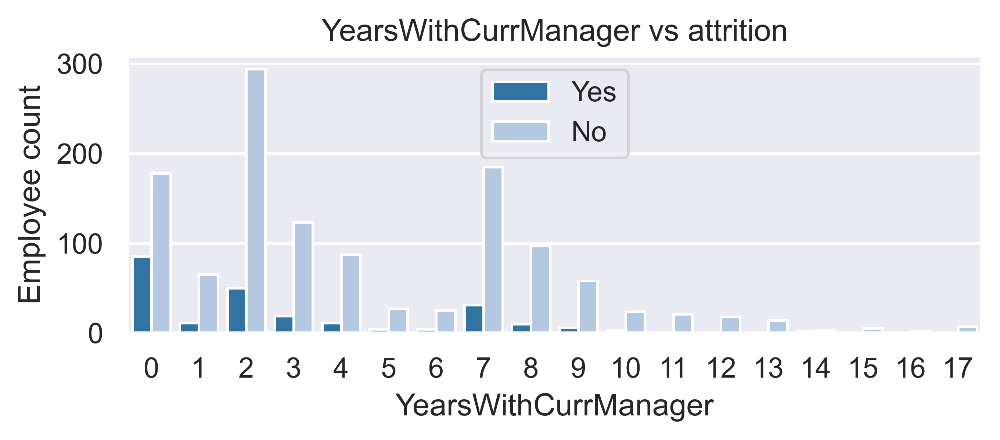

In [112]:
plt.figure(dpi=500, figsize=(6,2))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='YearsWithCurrManager', hue="Attrition", data=data_copy, palette='tab20')
plt.xlabel('YearsWithCurrManager')
plt.ylabel('Employee count')
plt.title('YearsWithCurrManager vs attrition')
plt.legend()

### It can be infered that people spending more number of years with the curent manager are less likely to leave the company than the employees spending less number of years

In [26]:
(data_copy.groupby(['PercentSalaryHike'])['Attrition'].value_counts(normalize=True)*100)

PercentSalaryHike  Attrition
11                 No           80.476190
                   Yes          19.523810
12                 No           83.333333
                   Yes          16.666667
13                 No           83.732057
                   Yes          16.267943
14                 No           88.059701
                   Yes          11.940299
15                 No           82.178218
                   Yes          17.821782
16                 No           82.051282
                   Yes          17.948718
17                 No           82.926829
                   Yes          17.073171
18                 No           85.393258
                   Yes          14.606742
19                 No           88.157895
                   Yes          11.842105
20                 No           87.272727
                   Yes          12.727273
21                 No           89.583333
                   Yes          10.416667
22                 No           78.571429
     

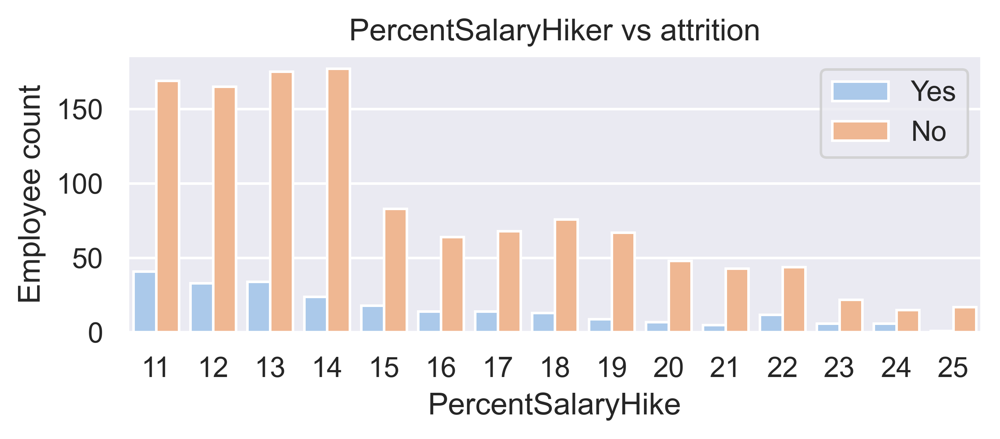

In [113]:

plt.figure(dpi=500, figsize=(6,2))
sns.set_theme(style="darkgrid",palette='deep',font='sans-serif')
sns.countplot(x='PercentSalaryHike', hue="Attrition", data=data_copy, palette='pastel')
plt.xlabel('PercentSalaryHike')
plt.ylabel('Employee count')
plt.title('PercentSalaryHiker vs attrition')
plt.legend()

### We can see that employees having 24%Salary Hike are more likely to leave. But nothing much can be incured from this data about attrition

## Important Takeaways
1. Attrition is getting reduced with age
2. Majority of the people in the age group 20-30 years are leaving the company, maybe in search of better position or job oppurtunities. And majority are staying back in the age group of 30-40 years.
3. More than 50% of attrition is seen in the age group of 10-20 years, but it is not a problem because very few employees are there in this age group and most of them would be interns only.
4. During the age group of 50-60 not many people are seen leaving the company as thats tha retirement time.
5. A comapratively higher percentage of employees who travel frequently tend to have higher attrition compared to employees who travel rarely or not travel at all.
6. A higher percentage of attrition in employees of Human Resources and Sales department. 
7. Singles are having higher tendency to leave the company
8. People spending more number of years with the curent manager are less likely to leave the company than the employees spending less number of years
9. 'Education level' and 'Percentage Salary Hike' are not having much significant effect on Attrition 
10. Employees with lower job level have a higher percentage of attrition.


## Part II- Feature Encoding

In [28]:
#Encoding using pandas.get_dummies
#Fetching only the categorical columns

one_hot_var = ['BusinessTravel', 'Department', 'EducationField',
       'JobRole', 'MaritalStatus', 'OverTime']

In [29]:
for i in one_hot_var:
    i_dummy = pd.get_dummies(data[i], prefix=i, prefix_sep='_', drop_first=True)
    data = data.join(i_dummy)
    data.drop(i, axis=1, inplace=True)

In [30]:
data.Attrition = data.Attrition.apply(lambda x: 1 if x=='Yes' else 0)
data.Gender = data.Gender.apply(lambda x : 1 if x=='Male' else 0)
data

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1102,1,2,1,2,0,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,0,279,8,1,2,3,1,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
2,37,1,1373,2,2,4,4,1,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1
3,33,0,1392,3,4,5,4,0,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,0,591,2,1,7,1,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,23,2,2061,3,1,41,4,2,4,2571,12290,4,17,3,3,1,17,3,3,5,2,0,3,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0
1466,39,0,613,6,1,2062,4,1,42,2,3,1,9991,21457,4,15,3,1,1,9,5,3,7,7,1,7,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1467,27,0,155,4,3,2064,2,1,87,4,2,2,6142,5174,1,20,4,2,1,6,0,3,6,2,0,3,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1
1468,49,0,1023,2,3,2065,4,1,63,2,2,2,5390,13243,2,14,3,4,0,17,3,2,9,6,0,8,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0


In [31]:
data.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director',

### Splitting the dataset into independent and dependent features

In [32]:
x = data.drop('Attrition', axis=1)
y = data['Attrition']

In [33]:
x.shape

(1470, 45)

In [34]:
 x.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Res

### Now checking for high multi-collinearity between the independent variables

In [35]:
x_cor = x.copy()

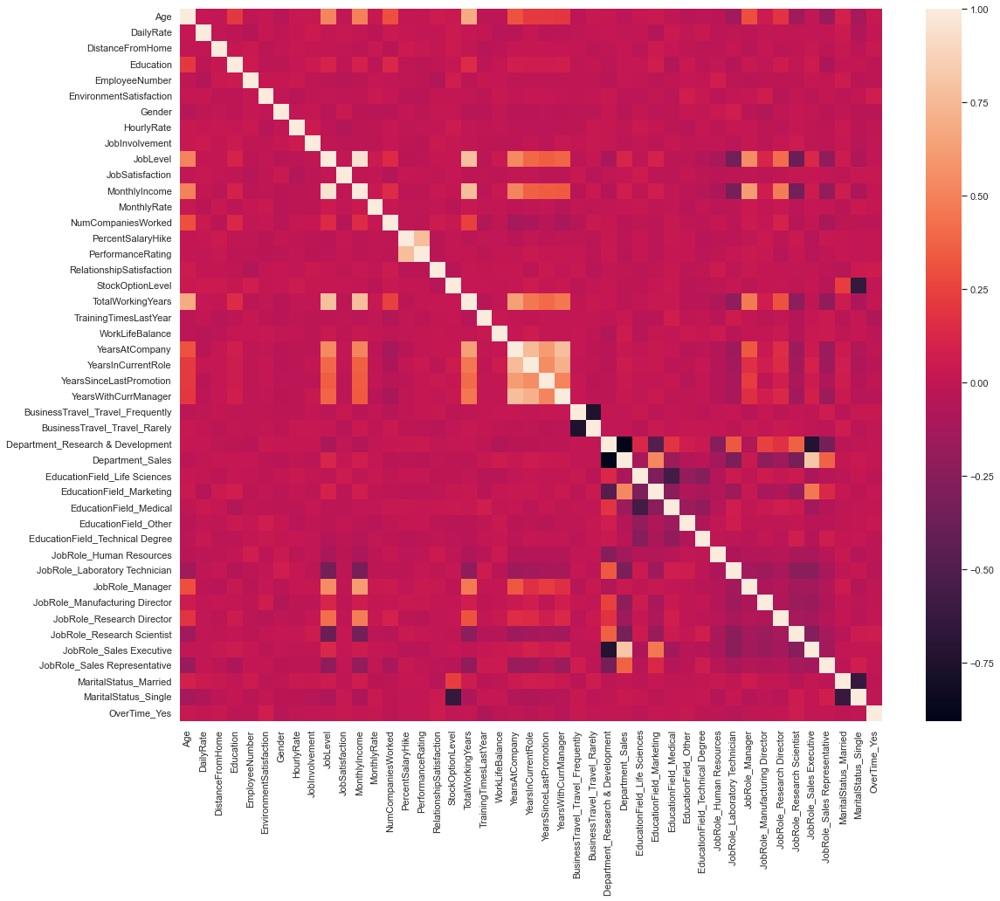

In [36]:
plt.figure(figsize=(18,15))
sns.heatmap(x_cor.corr())
plt.show()

<AxesSubplot:>

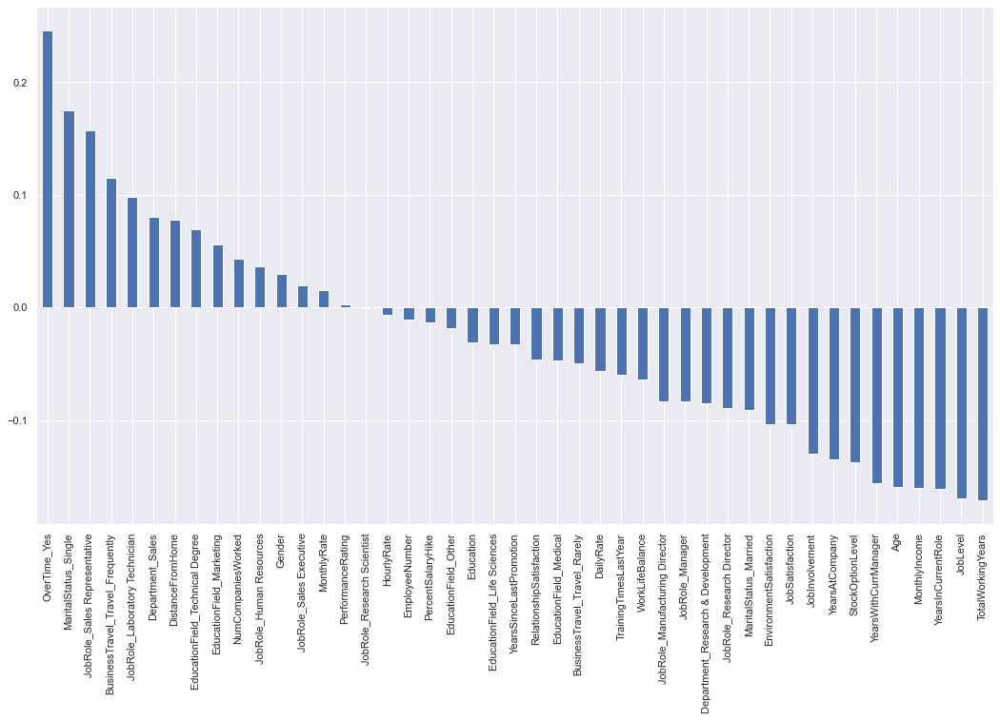

In [37]:
x_cor['Attrition'] = y
plt.figure(figsize=(18,10))
x_cor.corr()['Attrition'].sort_values(ascending=False)[1:].plot(kind='bar')    #We intend to find the correlation of the independent variables wrt 'Attrition'

### We want the columns that are highly multi-collinear between features

In [38]:
data_corr = x_cor.corr()
data_corr

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes,Attrition
Age,1.000000,0.010661,-0.001686,0.208034,-0.010145,0.010146,-0.036311,0.024287,0.029820,0.509604,-0.004892,0.497855,0.028051,0.299635,0.003634,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,-0.024743,0.028791,0.017883,-0.027549,0.016824,0.038162,-0.006354,-0.041466,-0.027604,-0.029856,-0.143176,0.294248,0.049726,0.185891,-0.146518,-0.002001,-0.175785,0.083919,-0.119185,0.028062,-0.159205
DailyRate,0.010661,1.000000,-0.004985,-0.016806,-0.050990,0.018355,-0.011716,0.023381,0.046135,0.002966,0.030571,0.007707,-0.032182,0.038153,0.022704,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,-0.011776,0.002078,0.014871,-0.003616,0.004028,-0.064449,0.034202,-0.003893,0.030869,-0.021156,-0.006728,-0.013224,-0.005302,-0.000021,-0.002624,-0.000513,0.005375,0.040035,-0.075835,0.009135,-0.056652
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,0.032916,-0.016075,-0.001851,0.031131,0.008783,0.005303,-0.003669,-0.017014,0.027473,-0.029251,0.040235,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,0.005081,-0.020116,-0.008117,0.014085,-0.024499,0.039294,0.013486,-0.007969,-0.014802,-0.024089,0.012369,-0.039190,0.011848,-0.022351,-0.010986,0.030761,-0.015994,0.030232,-0.027445,0.025514,0.077924
Education,0.208034,-0.016806,0.021042,1.000000,0.042070,-0.027128,-0.016547,0.016775,0.042438,0.101589,-0.011296,0.094961,-0.026084,0.126317,-0.011111,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.008292,0.004126,-0.018604,0.014215,0.013184,0.072405,-0.072335,0.038043,-0.026742,-0.005295,-0.063566,0.028453,-0.005290,0.049694,0.000709,0.053398,-0.091465,-0.001865,0.004168,-0.020322,-0.031373
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,1.000000,0.017621,0.022556,0.035179,-0.006888,-0.018519,-0.046247,-0.014829,0.012648,-0.001251,-0.012944,-0.020359,-0.069861,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197,-0.007980,-0.007976,-0.041923,0.015441,-0.000609,-0.014487,-0.008689,0.010432,0.005938,0.067287,-0.019722,-0.035058,-0.014350,-0.013983,-0.017686,0.023263,0.006255,0.053933,-0.035189,-0.024037,-0.010577
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,0.017621,1.000000,0.000508,-0.049857,-0.008278,0.001212,-0.006784,-0.006259,0.037600,0.012594,-0.031701,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,-0.012624,0.008496,0.027976,-0.025606,-0.024526,0.000479,-0.021299,0.064602,0.027713,-0.022014,-0.001533,0.010730,0.059178,-0.048689,0.001940,-0.024421,0.002949,-0.022180,0.009035,0.070132,-0.103369
Gender,-0.036311,-0.011716,-0.001851,-0.016547,0.022556,0.000508,1.000000,-0.000478,0.017960,-0.039403,0.033252,-0.031858,-0.041482,-0.039147,0.002733,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599,-0.022015,-0.014682,0.015760,-0.032017,0.006770,-0.024143,-0.013146,0.022992,0.003886,0.036082,0.067793,-0.033880,-0.065197,-0.006121,0.009745,-

In [39]:
data_corr.shape

(46, 46)

In [40]:
for i in range(data_corr.shape[0]):
    for j in range(data_corr.shape[1]):
        if (abs(data_corr.iloc[i,j]) > 0.8) & (abs(data_corr.iloc[i,j]) != 1):
            print(data_corr.iloc[i,j], 'between', data_corr.columns[j],'and', data_corr.index[i])
        

0.9502999134798473 between MonthlyIncome and JobLevel
0.9502999134798473 between JobLevel and MonthlyIncome
-0.9068182538582101 between Department_Sales and Department_Research & Development
-0.9068182538582101 between Department_Research & Development and Department_Sales
0.8088692708459275 between JobRole_Sales Executive and Department_Sales
0.8088692708459275 between Department_Sales and JobRole_Sales Executive


### We see that MonthlyIncome and JobLevel have high positive linear relation, whereas Sales and Research & Development under ' Department ' have high negative collinearity and we can drop either of these highly collinear columns, so as to avoid overfitting

In [41]:
for i in range(data_corr.shape[1]): 
    if (abs(data_corr.iloc[45,i]) > 0) and (abs(data_corr.iloc[45,i]) < 0.01):
         print(data_corr.iloc[45,i], 'between', data_corr.columns[i],'and', data_corr.index[45])

-0.006845549572139936 between HourlyRate and Attrition
0.0028887517110808684 between PerformanceRating and Attrition
-0.0003595713404365722 between JobRole_Research Scientist and Attrition


In [42]:
x.drop(columns = ['JobLevel'], axis=1,inplace=True)
x.shape

(1470, 44)

### To remove imbalancing in the dataset 

In [43]:
#applying smoting
# install imbalanced-learn 

In [44]:
pip install imbalanced-learn

In [45]:
from imblearn.over_sampling import SMOTE

In [46]:
smote = SMOTE(sampling_strategy='minority')
x_sm, y_sm = smote.fit_resample(x,y)
y_sm.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

### We see that now our dataset is balanced

 ## Feature Selection/Feature Importance

In [47]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

In [48]:
model = ExtraTreesClassifier()
model.fit(x_sm, y_sm)
model.feature_importances_

array([0.02232907, 0.01736541, 0.01862507, 0.02143555, 0.01724956,
       0.04652596, 0.01579624, 0.01787879, 0.04299239, 0.0517994 ,
       0.02658863, 0.02081662, 0.01686221, 0.01565554, 0.00965532,
       0.02743176, 0.04784667, 0.02363695, 0.02034886, 0.0253743 ,
       0.02193799, 0.02415235, 0.01629304, 0.02263341, 0.00995158,
       0.02352598, 0.03972617, 0.02412221, 0.0422293 , 0.01132647,
       0.04840624, 0.01122043, 0.01252339, 0.0081142 , 0.00880447,
       0.01187538, 0.01818061, 0.00765807, 0.01265994, 0.01370388,
       0.0046081 , 0.06233525, 0.01641436, 0.02138288])

<AxesSubplot:>

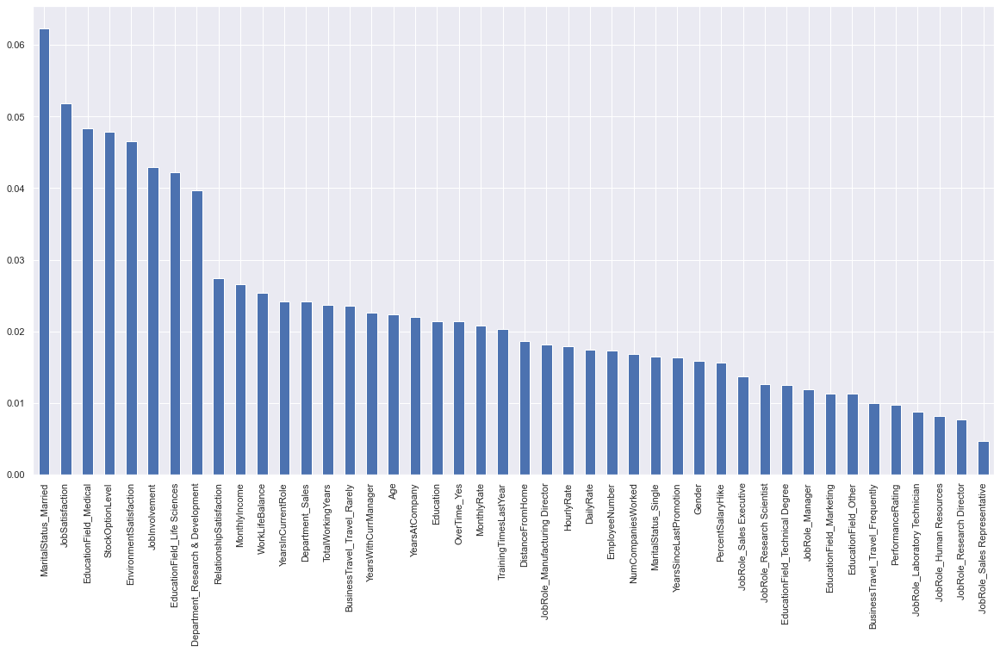

In [49]:
#visualizing the imporatant features
plt.figure(figsize=(20,10))
feat = pd.Series(model.feature_importances_, index = x_sm.columns)
feat.nlargest(44).plot(kind='bar')

In [50]:
plot = feat.nlargest(37)
plot.index

Index(['MaritalStatus_Married', 'JobSatisfaction', 'EducationField_Medical',
       'StockOptionLevel', 'EnvironmentSatisfaction', 'JobInvolvement',
       'EducationField_Life Sciences', 'Department_Research & Development',
       'RelationshipSatisfaction', 'MonthlyIncome', 'WorkLifeBalance',
       'YearsInCurrentRole', 'Department_Sales', 'TotalWorkingYears',
       'BusinessTravel_Travel_Rarely', 'YearsWithCurrManager', 'Age',
       'YearsAtCompany', 'Education', 'OverTime_Yes', 'MonthlyRate',
       'TrainingTimesLastYear', 'DistanceFromHome',
       'JobRole_Manufacturing Director', 'HourlyRate', 'DailyRate',
       'EmployeeNumber', 'NumCompaniesWorked', 'MaritalStatus_Single',
       'YearsSinceLastPromotion', 'Gender', 'PercentSalaryHike',
       'JobRole_Sales Executive', 'JobRole_Research Scientist',
       'EducationField_Technical Degree', 'JobRole_Manager',
       'EducationField_Marketing'],
      dtype='object')

In [51]:
cols = ['MaritalStatus_Married', 'EducationField_Medical', 'JobSatisfaction',
       'EnvironmentSatisfaction', 'EducationField_Life Sciences',
       'StockOptionLevel', 'JobInvolvement',
       'Department_Research & Development', 'BusinessTravel_Travel_Rarely',
       'RelationshipSatisfaction', 'MonthlyIncome', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
       'TotalWorkingYears', 'Education', 'Age', 'Department_Sales',
       'OverTime_Yes', 'TrainingTimesLastYear', 'MonthlyRate',
       'EmployeeNumber', 'HourlyRate', 'Gender', 'DistanceFromHome',
       'DailyRate', 'NumCompaniesWorked', 'MaritalStatus_Single',
       'YearsSinceLastPromotion', 'PercentSalaryHike',
       'JobRole_Manufacturing Director', 'JobRole_Sales Executive',
       'JobRole_Research Scientist', 'EducationField_Marketing',
       'EducationField_Technical Degree', 'EducationField_Other']

In [52]:
x_new = x_sm[cols]
print(x_sm.shape)
print(x_new.shape)

(2466, 44)
(2466, 37)


### We see that EmployeeNumber and Attrition are negatively related, and the relationship is not strong. So dropping the column would not bring much of significant difference to the dataset

## MODEL BUILDING

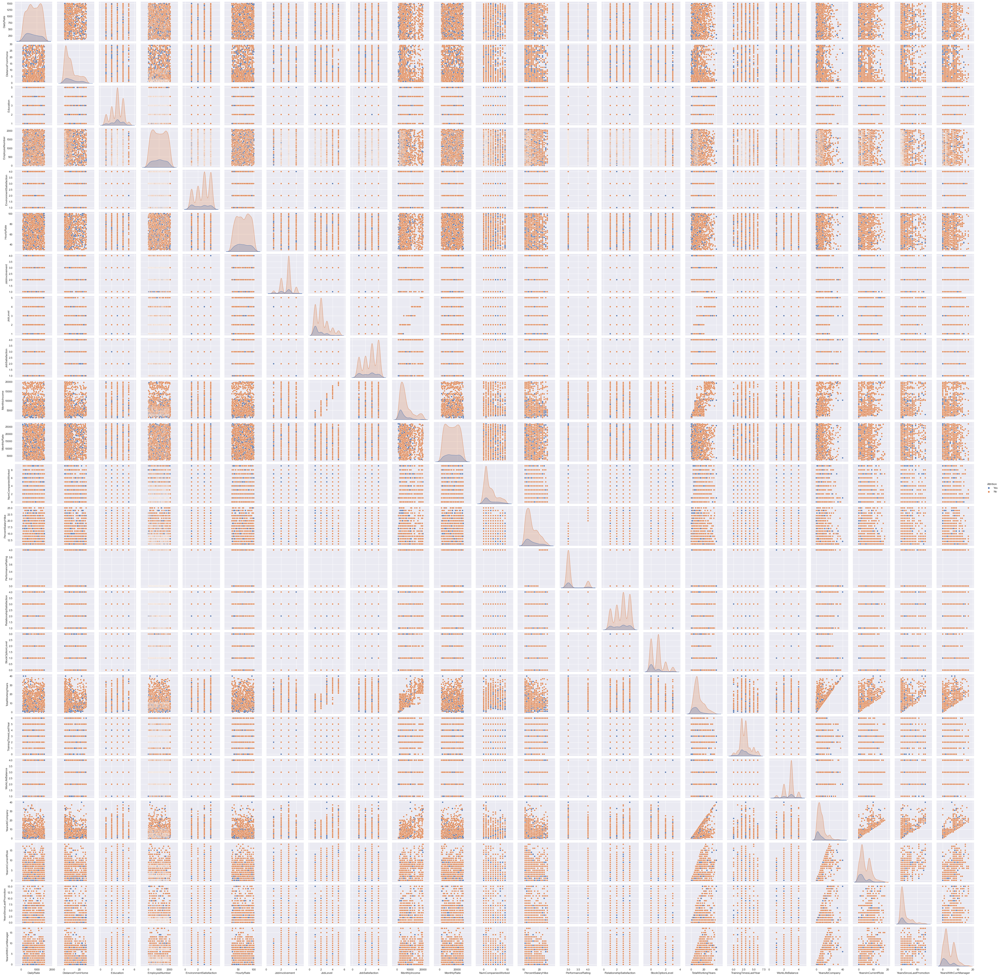

In [53]:
sns.pairplot(data_copy, hue='Attrition')

### From the pairplot we can see that the classes in Attrition are inseparable. Hence, fitting a linear logistic classifier will not give a good accuracy and probably using Random Forest, Decision Tree or K-Neares Neighbors can give a better result

In [54]:
#Importing the models:

from sklearn.ensemble import RandomForestClassifier
randomdf = RandomForestClassifier()
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
from sklearn.neighbors import KNeighborsClassifier
Knn = KNeighborsClassifier(n_neighbors = 6)
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()

### Applying KFold Cross-Validation to check which model can perform best with our dataset

In [55]:
from sklearn.model_selection import KFold, cross_val_score
kfold_validation = KFold(10)

In [56]:
result1 = cross_val_score(randomdf, x_new, y_sm,cv=kfold_validation, scoring='accuracy').mean()
print(result1)

0.9112883051907443


In [57]:
result2 = cross_val_score(dt, x_new, y_sm,cv=kfold_validation, scoring='accuracy').mean()
print(result2)

0.7605970837036307


In [58]:
result3 = cross_val_score(Knn, x_new, y_sm,cv=kfold_validation, scoring='accuracy').mean()
print(result3)

0.7244461999275863


In [59]:
result4 = cross_val_score(lg, x_new, y_sm,cv=kfold_validation, scoring='accuracy').mean()
print(result4)

0.5856374049570454


### The above k-fold Cross Validation suggests that random forest is the best model for our dataset and logistic classifier did not give a good accuracy

## Applying train_test_split

In [60]:
#train_test_split
from sklearn.model_selection import train_test_split

#importing libraries for evaluation:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix,classification_report

In [61]:
x_train, x_test, y_train, y_test = train_test_split(x_new,y_sm,test_size=0.25)

In [62]:
randomdf = RandomForestClassifier()
randomdf.fit(x_train, y_train)
ypred = randomdf.predict(x_test)

In [63]:
accuracy_score(y_test, ypred)

0.9238249594813615

In [64]:
precision_score(y_test, ypred)

0.925

In [65]:
f1_score(y_test, ypred)

0.9264475743348982

In [66]:
rf = confusion_matrix(y_test, ypred)
rf

array([[274,  24],
       [ 23, 296]], dtype=int64)

In [67]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       298
           1       0.93      0.93      0.93       319

    accuracy                           0.92       617
   macro avg       0.92      0.92      0.92       617
weighted avg       0.92      0.92      0.92       617



### We use Decision Tree Classifier for our dataset

In [68]:
dt.fit(x_train,y_train)
ypred2 = dt.predict(x_test)

In [69]:
ypred2

array([0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0,

In [70]:
accuracy_score(y_test,ypred2)

0.807131280388979

In [71]:
precision_score(y_test,ypred2)

0.7958579881656804

In [72]:
f1_score(y_test,ypred2)

0.8188736681887365

In [73]:
recall_score(y_test,ypred2)

0.8432601880877743

In [74]:
dt = confusion_matrix(y_test, ypred2)
dt

array([[229,  69],
       [ 50, 269]], dtype=int64)

In [75]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       298
           1       0.93      0.93      0.93       319

    accuracy                           0.92       617
   macro avg       0.92      0.92      0.92       617
weighted avg       0.92      0.92      0.92       617



### We use KNN for our dataset

In [76]:
Knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=6)

In [77]:
ypred3 = Knn.predict(x_test)
accuracy_score(y_test,ypred3)

0.779578606158833

In [78]:
precision_score(y_test,ypred3)

0.7506849315068493

### Logistic model

In [79]:
lg = LogisticRegression()
lg.fit(x_train, y_train)

LogisticRegression()

In [80]:
ypred4 = lg.predict(x_test)
ypred4

array([0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1,

In [81]:
accuracy_score(y_test, ypred4)

0.653160453808752

In [82]:
precision_score(y_test, ypred4)

0.6615384615384615

In [83]:
f1_score(y_test, ypred4)

0.6677018633540373

# Inference
Company must target the people who lie in the age group 20-30 since majority of attrition is seen in that age group. And people over 50 do not tend to leave the company since that is their retirement period. Employees who travel frequently tend to have higher attrition maybe because distance is a factor. Lower job level employees leave the most beacuse maybe most of them are the interns or seek for better position and job oppurtunities.Since, majorly Human Resources and Sales have higher attrition, so the company must take measures accordingly.

The Random Forest Classifier can classify and estimate the amount of probable positive responses for the comapny that want to analyse the attrition rate of their future employees using data from the past with an accuracy of 91%.
